In [1]:
import sys
from os import getcwd, makedirs
from os.path import join, exists, abspath
from glob import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps, cm, colors
import scipy
from scipy.stats import ttest_1samp, pearsonr
from scipy.spatial.distance import squareform
import h5py
import seaborn as sns

from tqdm import tqdm

In [2]:
import warnings

In [3]:
import nibabel as nb
from nilearn import plotting
from nipype.interfaces import fsl

In [4]:
dir_current = getcwd()
dir_current

'/home/sungbeenpark/github/SeqSpatialSupp_fMRI/scripts'

In [5]:
dir_git = dir_current.split('github')[0]+'github'
dir_git

'/home/sungbeenpark/github'

In [6]:
dir_work = '/mnt/f/SeqSpatialSupp_fMRI'
dir_result = join(dir_work, 'results')
makedirs(dir_result, exist_ok=True)

In [7]:
path_module = abspath(join(dir_git,'nitools'))
if exists(path_module):
    print('added the path, %s'%path_module)
    if path_module not in sys.path:
        sys.path.append(path_module)

import nitools as nt

added the path, /home/sungbeenpark/github/nitools


In [8]:
path_module = abspath(join(dir_git,'SUITPy'))
if exists(path_module):
    print('added the path, %s'%path_module)
    if path_module not in sys.path:
        sys.path.append(path_module)

import SUITPy as suit

added the path, /home/sungbeenpark/github/SUITPy


In [9]:
path_module = abspath(dir_git)
if exists(path_module):
    print('added the path, %s'%path_module)
    if path_module not in sys.path:
        sys.path.append(path_module)

import surfAnalysisPy as surf

added the path, /home/sungbeenpark/github


In [10]:
path_module = abspath(join(dir_git,'PcmPy'))
if exists(path_module):
    print('added the path, %s'%path_module)
    if path_module not in sys.path:
        sys.path.append(path_module)

import PcmPy as pcm

added the path, /home/sungbeenpark/github/PcmPy


In [11]:
# path_module = abspath(join(dir_git,'rsatoolbox/src'))
# if exists(path_module):
#     print('added the path, %s'%path_module)
#     if path_module not in sys.path:
#         sys.path.append(path_module)

# import rsatoolbox as rsa # python < 3.9

---

In [12]:
def convert_pvalue_to_asterisks(pvalue):
    if pvalue <= 0.0001:
        return "****"
    elif pvalue <= 0.001:
        return "***"
    elif pvalue <= 0.01:
        return "**"
    elif pvalue <= 0.05:
        return "*"
    return "ns"

---

In [13]:
list_ss = ['S','R']

In [14]:
list_nn = ['%02d'%(i+1) for i in range(14)]
list_nn.remove('04')
list_nn.remove('07')
list_nn

['01', '02', '03', '05', '06', '08', '09', '10', '11', '12', '13', '14']

In [15]:
list_run = ['r%02d'%(i+1) for i in range(8)]
list_run

['r01', 'r02', 'r03', 'r04', 'r05', 'r06', 'r07', 'r08']

#### State: $(s,c)$, where $s$ is sequence, $c$ is cue.

1. $s$:
    - 13254
    - 14523
    - 32451
    - 35124

2. $c$:
    - letter
    - spatial

3. conditions=state:
    - 1=(1,L)
    - 2=(1,S)
    - 3=(2,L)
    - 4=(2,S)
    - 5=(3,L)
    - 6=(3,S)
    - 7=(4,L)
    - 8=(4,S)
    - 9=Error cf) except R11

In [16]:
def func_cond2pair(idx):
    res = ''
    cond = int(idx)
    if cond in np.arange(1,9):
        cue = 'L' if cond%2==1 else 'S'
        seq = (cond-1)//2 + 1
        res = '(%s,%s)'%(seq,cue)
    
    return res

In [17]:
for idx in range(10):
    print(idx, func_cond2pair(idx))

list_label = [func_cond2pair(i) for i in np.arange(1,9)]
print(list_label)

0 
1 (1,L)
2 (1,S)
3 (2,L)
4 (2,S)
5 (3,L)
6 (3,S)
7 (4,L)
8 (4,S)
9 
['(1,L)', '(1,S)', '(2,L)', '(2,S)', '(3,L)', '(3,S)', '(4,L)', '(4,S)']


In [18]:
def load_spm(subj, dir_glm):
    fname = join(dir_glm, subj, 'SPM.mat')
    file = h5py.File(fname)
    SPM = file['SPM']
    iC = SPM['xX/iC'][:].reshape(-1).astype(int)-1

    res = []
    for cc in iC:
        ## e.g.) row = 'spm_spm:beta (0002) - Sn(1) Trial-State 2*bf(1)'
        ## e.g.) row = 'spm_spm:beta (0072) - Sn(8) Non-Interest*bf(1)'
        row = ''.join(map(chr, SPM[SPM['Vbeta/descrip'][:][cc,0]][:].reshape(-1)))
        beta = row.split(' ')[1]
        run = row.split(' ')[3]
        tmp = row.split(' ')[4:]
        cond = ' '.join(tmp).split('*')[0]
        res.append(
            {'beta':beta[1:-1], 'run':run, 'cond':cond}
        )
    descrip = pd.DataFrame(res)

    idx_interest = np.array(descrip[descrip.cond.str.contains('Trial-State')].index)
    part_vec = descrip.run.str.extract(r'(\d+(\.\d+)?)')[0][idx_interest].values.astype(int)
    cond_vec = descrip.cond.str.extract(r'(\d+(\.\d+)?)')[0][idx_interest].values.astype(int)
    
    return SPM, part_vec, cond_vec, idx_interest

In [19]:
glm = 'glm_3.[6 16]'

In [20]:
SPM, part_vec, cond_vec, _ = load_spm(subj='S01',dir_glm=join(dir_work,glm))
print('part_vec(%d)\n'%len(part_vec), part_vec)
print('cond_vec(%d)\n'%len(cond_vec), cond_vec)

part_vec(64)
 [1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 5 5 5 5 5
 5 5 5 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8]
cond_vec(64)
 [1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5
 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8]


In [21]:
# ## idx_interest: 8 regs/run * 8 runs = 64 regs
# indices = np.where((cond_vec >= 1) & (cond_vec <= 8))[0]
# print(len(indices), indices)

In [22]:
# part_vec = np.concatenate(
#     [np.concatenate([np.full(9,i+1) for i in range(8)]), np.full(8,0)]
# ).astype(int)
# print(part_vec.shape, part_vec)

In [23]:
# ## cond_vec = data['Vbeta']['descrip'][:,0][0]
# tmp = np.tile(np.arange(1,10), 8)
# cond_vec = np.concatenate([tmp, np.zeros(8)]).astype(int)
# print(cond_vec.shape, cond_vec)

In [24]:
# cond_vec = cond_vec[indices]
# cond_names = cond_names[indices]
# part_vec = part_vec[indices]
# print(cond_vec.shape, cond_names.shape, part_vec.shape)

In [25]:
cond_names = np.array([func_cond2pair(cc) for cc in cond_vec])
print(cond_names.shape, cond_names)

(64,) ['(1,L)' '(1,S)' '(2,L)' '(2,S)' '(3,L)' '(3,S)' '(4,L)' '(4,S)' '(1,L)'
 '(1,S)' '(2,L)' '(2,S)' '(3,L)' '(3,S)' '(4,L)' '(4,S)' '(1,L)' '(1,S)'
 '(2,L)' '(2,S)' '(3,L)' '(3,S)' '(4,L)' '(4,S)' '(1,L)' '(1,S)' '(2,L)'
 '(2,S)' '(3,L)' '(3,S)' '(4,L)' '(4,S)' '(1,L)' '(1,S)' '(2,L)' '(2,S)'
 '(3,L)' '(3,S)' '(4,L)' '(4,S)' '(1,L)' '(1,S)' '(2,L)' '(2,S)' '(3,L)'
 '(3,S)' '(4,L)' '(4,S)' '(1,L)' '(1,S)' '(2,L)' '(2,S)' '(3,L)' '(3,S)'
 '(4,L)' '(4,S)' '(1,L)' '(1,S)' '(2,L)' '(2,S)' '(3,L)' '(3,S)' '(4,L)'
 '(4,S)']


---

## Design Matrix

In [26]:
dir_glm = join(dir_work, glm)

In [27]:
subj = 'S01'

In [28]:
def get_design_X(subj, dir_glm):
    SPM, _, _, idx_interest = load_spm(subj, dir_glm)
    mat_X = SPM['xX/X'][:].T
    iB = SPM['xX/iB'][:].reshape(-1).astype(int)
    
    return mat_X, idx_interest, iB

In [29]:
mat_X, idx_interest, iB = get_design_X(subj, dir_glm)
print(mat_X.shape)
mat_X = mat_X[:, idx_interest]
print(mat_X.shape)

(3280, 80)
(3280, 64)


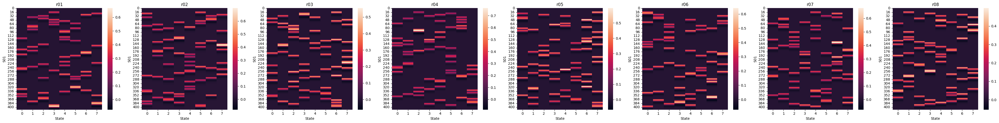

In [30]:
fig, axs = plt.subplots(nrows=1, ncols=8, figsize=(5*8,5))
for rr, run in enumerate(list_run):
    ax = axs[rr]
    idx_row = np.arange(410)+(410*rr)
    idx_col = np.arange(8)+(8*rr)
    mat_X_run = mat_X[idx_row][:,idx_col]
    sns.heatmap(mat_X_run, ax=ax)
    ax.set_title(run)
    ax.set_ylabel(subj)
    ax.set_xlabel('State')
fig.tight_layout()

### onset 0 vs. onset move

In [31]:
# fig, axs = plt.subplots(nrows=8, figsize=(12,16))
# t = range(410)

# subj = 'S01'
# for ii, glm in enumerate(['glm_3.onset0','glm_3.onset_move']):
#     fname = join('F:/SeqSpatialSupp_fMRI', glm, subj, 'SPM.mat')
#     print(fname, exists(fname))

#     if ii == 0:
#         color = 'blue'
#     else:
#         color = 'red'
#     feature = h5py.File(fname)
#     data = feature['SPM']
#     mat_X = data['xX']['X'][:].T
#     mat_X = mat_X[:,indices]

#     for jj, label in enumerate(list_label):
#         ax = axs[jj]
#         ax.plot(t, mat_X[t,jj], label=glm, color=color)
#         ax.grid(axis='y', linestyle='--')
#         ax.legend()
#         ax.set_title(label)

# fig.tight_layout()

---

## Freesurfer

In [32]:
def gifti_to_cmap(label_img):
    if isinstance(label_img, str):
        label_img = nb.load(label_img)
    if not isinstance(label_img, nb.gifti.gifti.GiftiImage):
        raise TypeError("Expected 'gifti' file")

    labels = label_img.labeltable.labels
    rgba = np.zeros((len(labels),4))
    for i,label in enumerate(labels[1:]):
        rgba[i+1,:] = labels[i].rgba
    
    cmap = colors.ListedColormap(rgba, N=len(rgba))

    return cmap

In [33]:
def cmap_to_cbar(cmap, list_label):
    # 0~11 값이 각각 구간 중앙에 오도록 boundaries 설정
    N = cmap.N
    norm = colors.BoundaryNorm(boundaries=np.arange(-0.5, N, 1), ncolors=N)
    
    # colorbar만 따로 그리기
    fig, ax = plt.subplots(figsize=(8, 1))
    fig.subplots_adjust(bottom=0.5)
    
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # 더미 mappable
    
    cbar = fig.colorbar(sm, cax=ax, orientation='horizontal', ticks=np.arange(N))
    
    # 라벨을 변경
    if N == len(list_label)+1:
        labels = np.concatenate((['0'],list_label))
    elif N == len(list_label):
        labels = list_label
    else:
        labels = 0
    cbar.ax.set_xticklabels(labels)
    
    plt.show()

In [34]:
dir_atlas = join(dir_git,'SeqSpatialSupp_fMRI/atlas/fs_LR_32k')
Hem = ['L','R']
print(exists(dir_atlas))

True


In [35]:
underlay = join(dir_atlas,'fs_LR.32k.LR.sulc.dscalar.gii')
border = join(dir_git,'surfAnalysisPy/standard_mesh/fs_L/fs_LR.32k.L.border')

In [36]:
roi = nb.load(join(dir_atlas,'ROI.L.SSS.label.gii'))
# list_roi = ['SMA', 'PMv', 'PMd', 'M1', 'S1', 'SPLa', 'SPLp', 'DSVC', 'MT+', 'VSVC', 'EAC']

roi = nb.load(join(dir_atlas,'ROI.32k.L.label.gii'))
list_roi = ['S1', 'M1', 'PMd', 'PMv', 'SMA', 'V1', 'SPLa', 'SPLp']

data_roi = roi.darrays[0].data

# roi = nib.load(join(dir_atlas,'ROI.32k.L.label.gii'))
# list_roi = ['S1', 'M1', 'PMd', 'PMv', 'SMA', 'V1', 'SPLa', 'SPLp']
# data_roi = roi.darrays[0].data

print(np.unique(data_roi), data_roi.shape)

[0 1 2 3 4 5 6 7 8] (32492,)


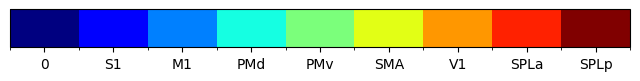

In [37]:
# cmap = gifti_to_cmap(data)
cmap = cm.jet.resampled(9)
cmap_to_cbar(cmap, list_roi)

<Axes: >

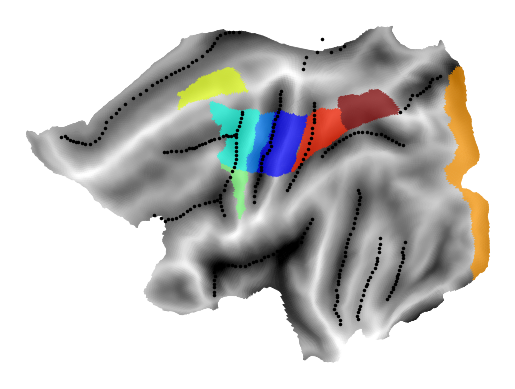

In [38]:
fig, ax = plt.subplots()

plt.sca(ax)
surf.plot.plotmap(
    data=data_roi,
    surf='fs32k_L',
    underlay=underlay, alpha=0.7, cmap=cmap, colorbar=False,
    borders=border, bordercolor='black', bordersize=3,
    overlay_type='func', render='matplotlib'
)

---

## Load $\beta$

In [39]:
dir_surf = join(dir_work,'surfaceWB')

### Individual Data

In [40]:
beta = np.zeros((len(cond_vec), len(data_roi)))
beta.shape

(64, 32492)

In [41]:
idx_interest

array([ 0,  1,  2,  3,  4,  5,  6,  7,  9, 10, 11, 12, 13, 14, 15, 16, 18,
       19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37,
       38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56,
       57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 69, 70])

In [42]:
subj = 'S01'

_, part_vec, cond_vec, idx_interest = load_spm(subj=subj,dir_glm=join(dir_work,glm))

## whole surface data
fname = join(dir_surf,glm,subj,'%s.L.glm3.beta.func.gii'%subj)
img = nb.load(fname)
for ii, idx in enumerate(idx_interest):
    data = img.darrays[idx]
    beta[ii,:] = data.data

print(beta.mean(axis=1))

[ 2.05918617e+00  1.37674117e+00  6.50287848e-01  9.97617394e-01
  1.16929325e+00  2.39280128e+00  3.63599795e-01  1.23132443e+00
  7.58722243e-01  1.26328624e+00  4.03583065e-01  1.87066805e+00
  9.42933478e-01  1.59861639e+00  1.31660121e+00  1.19025105e+00
  5.72811217e-01  6.39926534e-01  1.32417693e+00  4.18016297e-01
  2.14221947e+00  3.00263524e-01 -1.24629541e-01  5.98141397e-01
  1.03289697e+00  9.32819811e-01  5.62966515e-01  1.31308987e-01
  2.08499497e-01  3.20159756e-01  1.48996588e-01 -2.90510015e-01
 -2.34463702e-01  1.14746043e+00 -1.30548953e-01  5.86062251e-01
 -8.44185640e-01 -5.03728000e-01  4.26382569e-01  3.43959284e-01
  8.79622641e-01  1.50125397e+00  9.23488130e-01  1.12691568e+00
  7.79624465e-01  6.91002287e-01 -8.44588458e-01  5.32326235e-01
  1.02592584e+00  2.70679393e+00  1.17888606e+00  1.19593532e+00
  1.12706971e+00  1.72395693e+00  4.66757110e-01  2.19714917e+00
  3.12276914e-01  2.28597016e+00 -5.12815688e-01  1.62014498e+00
  4.00014790e-01  2.22763

<Axes: >

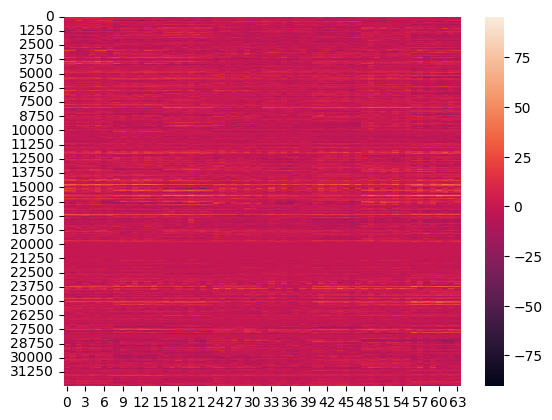

In [43]:
sns.heatmap(beta.T)

(64, 2)


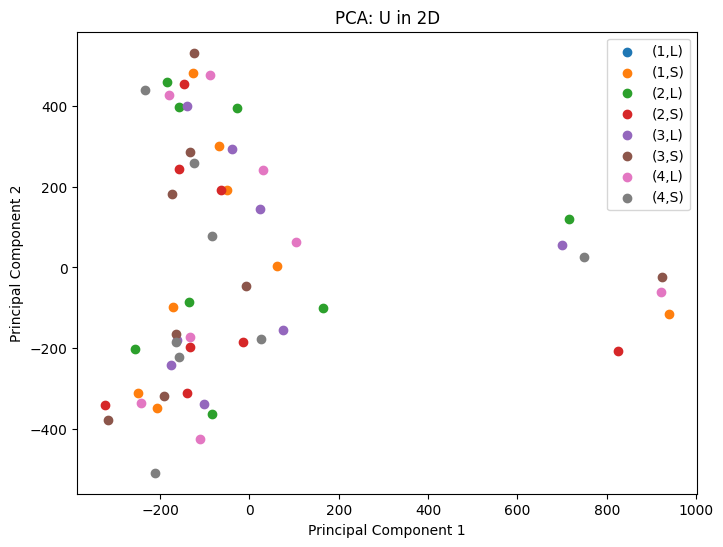

In [44]:
from sklearn.decomposition import PCA

# PCA 적용 (2D로 축소)
pca = PCA(n_components=2)  # 2개의 주성분
beta_pca = pca.fit_transform(beta)
print(beta_pca.shape)

# 결과 시각화
plt.figure(figsize=(8, 6))
for target, label in enumerate(np.unique(cond_names)):
    plt.scatter(beta_pca[cond_vec == target, 0], beta_pca[cond_vec == target, 1], label=label)
plt.title('PCA: U in 2D')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

### onset 0 vs. onset move

In [45]:
# nrows, ncols = 2, len(list_label)
# fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 6*nrows))
# # axs = np.concatenate(axs)

# subj = 'S01'
# for ii, glm in enumerate(['glm3.onset0','glm3.onset_move']):
#     beta = np.zeros((len(cond_vec), len(data_roi)))
#     fname = join(dir_surf,glm,'%s.L.glm3.beta.func.gii'%subj)
#     img = nb.load(fname)
    
#     for jj, idx in enumerate(indices):
#         data = img.darrays[idx]
#         beta[jj,:] = data.data
    
#     for jj, label in enumerate(list_label):
#         ax = axs[ii,jj]
#         plt.sca(ax)
        
#         g = surf.plot.plotmap(
#             data=beta[cond_vec==jj+1,:].mean(axis=0),
#             surf='fs32k_L', underlay=underlay, alpha=0.7,
#             cmap=cm.jet, colorbar=True, #cscale=[-2,2]
#             borders=border, bordercolor='black', bordersize=3, 
#             render='matplotlib'
#         )
#         if ii==1:
#             ax.set_title(label)
#         if jj==0:
#             ax.set_ylabel(glm)

### Group Data

In [46]:
Y = np.ones((2*len(list_nn), len(cond_vec), 32492)) * np.nan
Y.shape

(24, 64, 32492)

In [47]:
for ii, ss in enumerate(['S','R']):
    for jj, nn in enumerate(list_nn):
        subid = ii*len(list_nn)+jj
        subj = ss+nn
        fname = join(dir_surf,glm,subj,'%s.L.glm3.beta.func.gii'%subj)
        print(subj, exists(fname))
        if not exists(fname):
            continue
        _, part_vec, cond_vec, idx_interest = load_spm(subj=subj,dir_glm=join(dir_work,glm))
        img = nb.load(fname)
        print(len(img.darrays))
        for kk, idx in enumerate(idx_interest):
            data = img.darrays[idx].data
            if np.isnan(data).sum() > 0:
                print('NaN:', subj, idx)
            Y[subid][kk] = data

S01 True
72
S02 True
72
S03 True
72
S05 True
72
S06 True
72
S08 True
72
S09 False
S10 True
72
S11 True
72
S12 True
72
S13 True
72
S14 True
72
R01 True
72
R02 True
72
R03 True
72
R05 True
72
R06 True
72
R08 True
72
R09 False
R10 True
72
R11 True
64
R12 True
72
R13 True
64
R14 True
72


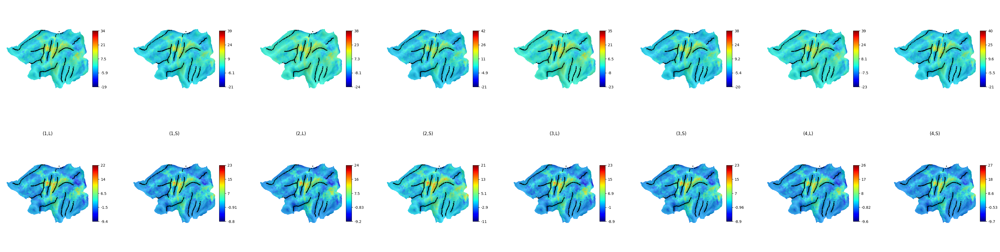

In [48]:
nrows, ncols = 2, len(list_label)
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 6*nrows))
# axs = np.concatenate(axs)

for ii, group in enumerate(['S','R']):
    idx = np.arange(12)+12*ii
    for jj, label in enumerate(list_label):
        ## row: group (S/R), col: condition (seq,cue)
        ax = axs[ii,jj]
        plt.sca(ax)
        data = np.nanmean(Y[idx][:,cond_vec==jj+1,:], axis=(0,1))
        g = surf.plot.plotmap(
            data=data,
            surf='fs32k_L', underlay=underlay, alpha=0.7,
            cmap=cm.jet, colorbar=True, #cscale=[-2,2
            borders=border, bordercolor='black', bordersize=3,
            overlay_type='func', label_names=list_roi, render='matplotlib'
            # overlay_type='label', label_names=['SMA','PMv','PMd','M1','S1','aSPL','pSPL','DSVC']
        )
        if ii==1:
            ax.set_title(label)
        if jj==0:
            ax.set_ylabel(group)

In [49]:
fig.savefig(
    join(dir_result,'fig.%s.beta.surface.png'%glm),
    dpi=300, facecolor=[1,1,1,1],
    bbox_inches='tight'
)

---

## Organizing data by ROI

In [50]:
dict_Y = {}
for ii, roi in enumerate(list_roi):
    val = ii+1
    print(roi)
    print(Y[:,:,data_roi==val].shape)
    dict_Y[roi] = Y[:,:,data_roi==val]
del Y

S1
(24, 64, 773)
M1
(24, 64, 305)
PMd
(24, 64, 754)
PMv
(24, 64, 247)
SMA
(24, 64, 383)
V1
(24, 64, 771)
SPLa
(24, 64, 615)
SPLp
(24, 64, 625)


## RSA

In [51]:
print(len(cond_vec), cond_vec)
print(len(part_vec), part_vec)

64 [1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5
 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8 1 2 3 4 5 6 7 8]
64 [1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 5 5 5 5 5
 5 5 5 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8]


In [52]:
obs_des = {
    'cond_vec': cond_vec,
    'part_vec': part_vec
}
dataset_Y = {}
for roi in list_roi:
    Y = dict_Y[roi]
    tmp = []
    for subid in range(len(Y)):
        tmp.append(pcm.dataset.Dataset(Y[subid], obs_descriptors = obs_des))
    dataset_Y[roi] = tmp

del dict_Y

### - Second moment matrix $G$:
$$
G = \text{var}(U) = \frac{UU^{T}}{P}
$$

cf)
$$
Y = ZU + XB + \epsilon
$$
where $Y$ is activity data $(N \times P)$, $Z$ is a condition matrix $(N \times K)$, and $X$ is a fixed effect matrix to be removed. Additionally, $N$ represents the number of samples, $P$ stands for the number of voxels or channels, and $K$ denotes the number of conditions.

### - Remove fixed effects $X$ from $Y$
$$
Y' = Y - XB = Y - X\big(X^{+}Y\big)
$$
Now, the matrix $Y'$ can be organized as follows.
$$
Y' = ZU + \epsilon
$$
Here, if $Z$ represents an indicator for the condition, then $Y' = U$:
$$
Y'_{ij} = Z_{ik}U_{kj}, \text{ where } Z_{ik} = \delta_{ik}
$$

### - Cross-validation
Let $Z_{i}$ be the $Z$ matrix of the $i$-th block and $Y'_{i}$ be the $Y'$ matrix of the $i$-th block. If we denote all blocks except for the $i$-th block as $\neg i$, the matrix $U$ can be determined as follows.
$$U_{i}=Z_{i}^{+}Y'_{i} + \epsilon_{i}$$
$$U_{\neg i}=Z_{\neg i}^{+}Y'_{\neg i} + \epsilon_{\neg i}$$
Note that both $U_{i}$ and $U_{\neg i}$ are $(K \times P)$ matrices. The second moment matrix $\hat{G}$ can then be computed as follows:
$$
\hat{G} = \frac{1}{B}\sum_{i}^{B}\frac{U_{i}U_{\neg i}}{P}
$$
where $B$ denotes the number of blocks.

In [53]:
# ## If Y is the beta map, then Y = U.
# roi = 'M1'
# idx = np.where(part_vec==1)[0]
# Y = dict_Y[roi][0][idx]
# print(Y.shape)
# Z = pcm.indicator(cond_vec[idx])
# print(Z.shape)
# U = np.linalg.pinv(Z)@Y
# print(U.shape)

# sns.heatmap(U-Y)

  0%|                                                             | 0/8 [00:00<?, ?it/s]

S1
(24, 8, 8)


/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


[-6.23416249e-18 -1.24900090e-16 -2.55871713e-17  2.10335221e-17
 -1.69135539e-17  2.68882139e-17             nan  7.32920669e-17
 -6.31439345e-16  2.53703308e-17 -6.93889390e-17 -4.33680869e-17
  5.96311195e-18  6.48352899e-17  3.03576608e-17 -1.17635936e-17
 -2.34729770e-17  3.46944695e-18             nan  8.76035355e-17
  1.90819582e-17  4.98732999e-18  5.29090660e-17  4.59701721e-17]


 12%|██████▋                                              | 1/8 [00:25<03:01, 25.92s/it]

M1
(24, 8, 8)


/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


[-9.75781955e-18 -5.72458747e-17 -7.04731412e-18  1.73472348e-18
  3.55618313e-17  1.04083409e-17             nan -5.07406617e-17
 -3.24393290e-16  1.40946282e-17  1.82145965e-17  1.45716772e-16
 -1.84314369e-18 -6.28837260e-18  1.69135539e-17  6.28837260e-18
  6.81963166e-17  2.60208521e-18             nan -3.64291930e-17
  3.94649591e-17 -6.66784336e-18 -6.93889390e-18  2.94902991e-17]


 25%|█████████████▎                                       | 2/8 [00:46<02:17, 22.96s/it]

PMd
(24, 8, 8)


/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


[-3.14418630e-18  3.29597460e-17  4.33680869e-18  1.30104261e-17
  1.41379963e-16 -3.64291930e-17             nan  1.19695920e-16
  3.05311332e-16  1.32814766e-18  4.68375339e-17  8.67361738e-17
 -3.90312782e-18  3.90312782e-18 -2.99239800e-17  1.51246203e-17
 -2.68882139e-17 -3.15502832e-17             nan  5.20417043e-18
  1.42247325e-16 -5.14996032e-18 -2.16840434e-17  1.95156391e-17]


 38%|███████████████████▉                                 | 3/8 [01:16<02:09, 25.85s/it]

PMv
(24, 8, 8)


/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


[ 3.46944695e-18  6.93889390e-17  1.99493200e-17  1.08420217e-17
 -1.73472348e-18  2.60208521e-17             nan  2.03830008e-16
  7.37257477e-17  7.37257477e-18 -4.03323208e-17 -6.93889390e-17
 -6.93889390e-18  1.08420217e-18 -7.37257477e-18  2.45029691e-17
 -1.25767452e-17 -3.38271078e-17             nan  3.46944695e-18
 -4.75314232e-16 -2.31070588e-18  6.39679282e-18  2.16840434e-18]


 50%|██████████████████████████▌                          | 4/8 [01:39<01:39, 24.79s/it]

SMA
(24, 8, 8)


/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


[-1.73472348e-18  1.04083409e-16  4.33680869e-17  1.34441069e-17
  1.14925430e-17  3.72965547e-17             nan  1.91686944e-16
  3.12250226e-17  1.78893358e-18 -2.16840434e-18  8.15320034e-17
  5.63785130e-18 -3.15502832e-17 -1.36609474e-17 -9.10729825e-18
 -1.10046521e-17  7.80625564e-18             nan  3.81639165e-17
  1.71737624e-16  8.23993651e-18 -4.55364912e-18  7.11236625e-17]


 62%|█████████████████████████████████▏                   | 5/8 [01:59<01:09, 23.16s/it]

V1
(24, 8, 8)


/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


[-2.77555756e-17 -1.00613962e-16 -3.88578059e-16 -2.77555756e-17
 -6.24500451e-17  1.52655666e-16             nan  4.22838847e-17
 -1.94289029e-16  1.24900090e-16  0.00000000e+00 -7.28583860e-17
 -1.38777878e-17  5.20417043e-17  1.66533454e-16  0.00000000e+00
  1.69135539e-17  6.93889390e-17             nan  7.37257477e-17
 -3.33066907e-16 -6.93889390e-17 -2.77555756e-16  5.20417043e-17]


 75%|███████████████████████████████████████▊             | 6/8 [02:31<00:52, 26.05s/it]

SPLa
(24, 8, 8)


/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


[ 2.56955915e-17 -5.20417043e-18 -4.33680869e-17 -6.45100293e-18
 -3.64291930e-17 -6.93889390e-17             nan  2.62376926e-17
 -3.46944695e-16  1.65882932e-17  6.17995238e-17 -5.16080234e-17
  3.25260652e-17 -9.32413868e-18 -4.70543743e-17  1.14383329e-17
 -3.97902197e-17  6.93889390e-18             nan  6.50521303e-17
  2.30718222e-16 -4.33680869e-18  9.54097912e-18  1.62196645e-16]


 88%|██████████████████████████████████████████████▍      | 7/8 [02:51<00:24, 24.06s/it]

SPLp
(24, 8, 8)


/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sungbeenpark/anaconda3/envs/sss/lib/python3.8/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


[ 1.38777878e-16 -7.02563008e-17  1.24900090e-16 -4.85722573e-17
  8.67361738e-19  2.58473798e-16             nan  7.28583860e-17
 -1.95676808e-15  1.69135539e-17 -4.33680869e-18  9.02056208e-17
  6.07153217e-17  3.81639165e-17 -8.32667268e-17  6.93889390e-17
 -1.21430643e-17  8.89045781e-17             nan -2.16840434e-16
 -1.15359111e-16  2.51534904e-17 -3.90312782e-17  8.97719399e-17]


100%|█████████████████████████████████████████████████████| 8/8 [03:13<00:00, 24.24s/it]


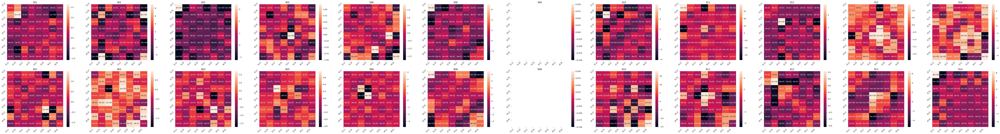

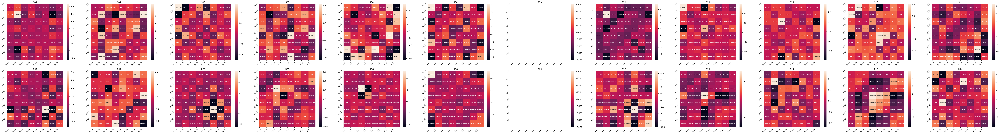

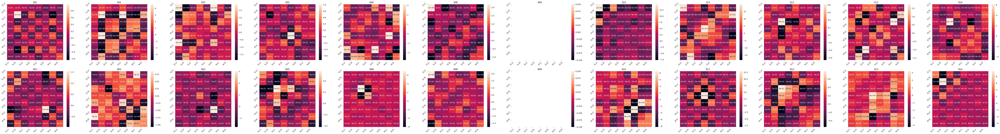

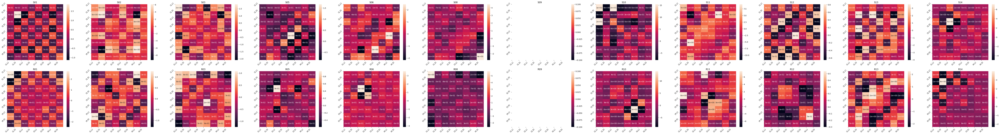

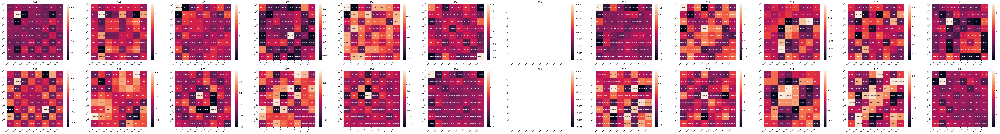

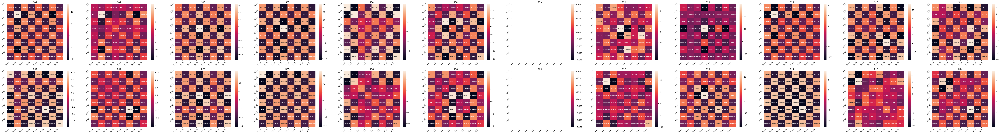

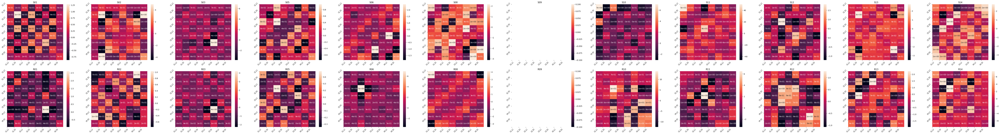

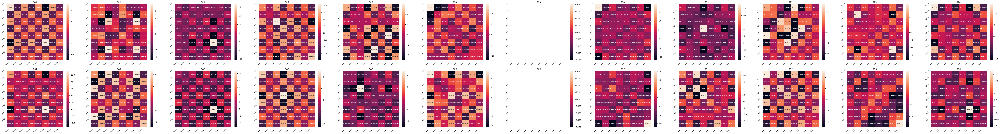

In [54]:
nrows, ncols = 2, 12
# Estimate and plot the second moment matrices G across all data sets
dict_G_hat = {}
for roi in tqdm(list_roi):
    print(roi)
    Y = dataset_Y[roi]
    N=len(Y)
    G_hat = np.zeros((N,8,8))
    for subid in range(N):
        G_hat[subid,:,:],_ = pcm.est_G_crossval(
            Y=Y[subid].measurements,
            Z=Y[subid].obs_descriptors['cond_vec'],
            part_vec=Y[subid].obs_descriptors['part_vec'],
            X=pcm.matrix.indicator(Y[subid].obs_descriptors['part_vec'])
        )
    print(G_hat.shape)
    
    fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(8*ncols, 6*nrows))
    axs = np.concatenate(axs)
    # show all second moment matrices G
    ## G.shape = (n_subject, 5, 5)
    vmin = G_hat.min()
    vmax = G_hat.max()
    for subid in range(N):
        ax = axs[subid]
        # ax.imshow(G_hat[subid,:,:],vmin=vmin,vmax=vmax)
        sns.heatmap(G_hat[subid,:,:], annot=True, fmt='.0e', ax=ax)
        ss = 'S' if subid//12==0 else 'R'
        nn = list_nn[subid%12]
        subj = ss+nn
        ax.set_title(subj)
        ax.set_xticks(np.arange(len(list_label)), list_label, rotation=45)
        ax.set_yticks(np.arange(len(list_label)), list_label, rotation=45)

    dict_G_hat[roi] = G_hat
    ## mean of each G_hat is 0
    print(np.mean(G_hat, axis=(1,2)))

    fig.savefig(
        join(dir_result,'fig.%s.G_hat.%s.png'%(glm,roi)),
        dpi=300, facecolor=[1,1,1,1],
        bbox_inches='tight'
    )

### Check the validation of $\hat{G}s$

1. summations

In [55]:
# ## row of G_hat
# print((G_hat.mean(axis=1) > 1e-8).sum())

# ## col of G_hat
# print((G_hat.mean(axis=2) > 1e-8).sum())

# ## diag of G_hat
# diagonals = np.array([np.diagonal(mat) for mat in G_hat])
# print(diagonals.shape, np.sum(diagonals, axis=1))
# sns.heatmap(diagonals, annot=True, fmt='.0e')

#### 2. correlation

i. correlation($\hat{G}_{i}, \hat{G}_{\neg i}$)

In [56]:
# for key, value in dataset_Y.items():
    # del dataset_Y[key][9+12-1]
    # del dataset_Y[key][9-1]

In [57]:
list_df = []

for roi in tqdm(list_roi):
    # print(roi)
    Y = dataset_Y[roi]
    N=len(Y)
    ## obtain the second moment matrix G
    G_hat = np.zeros((N,8,8))
    for subid in range(N):
        G_hat[subid,:,:],_ = pcm.est_G_crossval(
            Y=Y[subid].measurements,
            Z=Y[subid].obs_descriptors['cond_vec'],
            part_vec=Y[subid].obs_descriptors['part_vec'],
            X=pcm.matrix.indicator(Y[subid].obs_descriptors['part_vec'])
        )
    ## calculate correlation
    for gg, group in enumerate(['S','R']):
        idx_g = [i+gg*12 for i in range(12)]
        G_tmp = G_hat[idx_g]
        for ii, nn in enumerate(list_nn):
            idx_a = [True if i==ii else False for i in range(12)]
            idx_b = [True if i!=ii else False for i in range(12)]
            a = G_tmp[idx_a][0]
            if np.isnan(a).sum()>0:
                continue
            b = np.nanmean(G_tmp[idx_b], axis=0)
            
            idx_triu = np.triu_indices(a.shape[0])
            coef, pval = pearsonr(
                a[idx_triu], b[idx_triu]
            )
            list_df.append(
                {'roi':roi, 'sess':group, 'subj':nn, 'corr':coef, 'pval':pval}
            )

df = pd.DataFrame(list_df)
df

100%|█████████████████████████████████████████████████████| 8/8 [00:07<00:00,  1.01it/s]


,roi,sess,subj,corr,pval
0,S1,S,01,0.042263,8.066573e-01
1,S1,S,02,0.056412,7.438290e-01
2,S1,S,03,0.406828,1.380201e-02
3,S1,S,05,0.087880,6.102884e-01
4,S1,S,06,0.309170,6.653597e-02
...,...,...,...,...,...
171,SPLp,R,10,0.441205,7.069356e-03
172,SPLp,R,11,0.708310,1.345251e-06
173,SPLp,R,12,0.894821,1.861154e-13
174,SPLp,R,13,0.179426,2.950583e-01


Text(0.5, 1.0, 'glm_3.[6 16]')

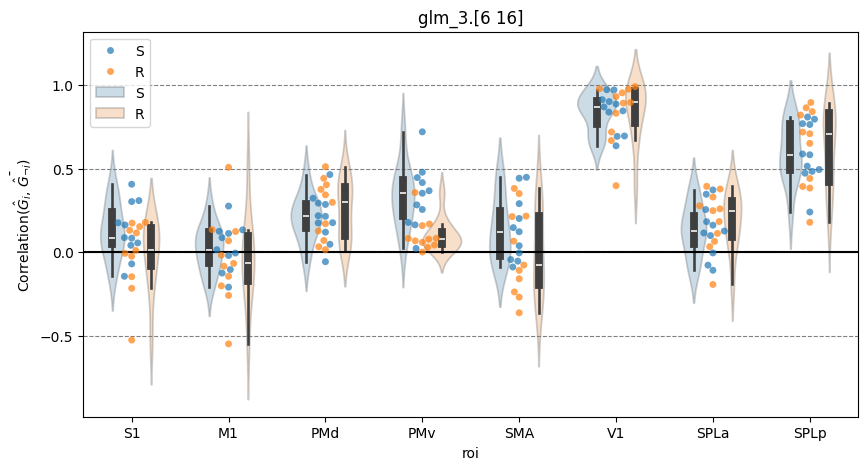

In [58]:
fig, ax = plt.subplots(figsize=(10,5))

sns.swarmplot(
    data=df,
    x='roi', y='corr', hue='sess',
    alpha=0.7,
    ax=ax
)
sns.violinplot(
    data=df,
    x='roi', y='corr', hue='sess',
    alpha=0.25,
    ax=ax
)
ax.grid(axis='y', linestyle='--', color='gray')
ax.legend()
ax.axhline(y=0, color='black')
# ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=40, ha='right')
ax.set_ylabel(r'Correlation($\hat{G}_{i}$, $\bar{\hat{G}_{\neg i}}$)')
ax.set_title(glm)

S1 S 2.698e-02(*)
PMd S 6.556e-04(***)
PMd R 7.476e-04(***)
PMv S 1.404e-04(***)
PMv R 5.740e-03(**)
SMA S 3.893e-02(*)
V1 S 3.093e-10(****)
V1 R 2.682e-08(****)
SPLa S 1.704e-02(*)
SPLa R 4.698e-03(**)
SPLp S 6.116e-07(****)
SPLp R 5.759e-06(****)


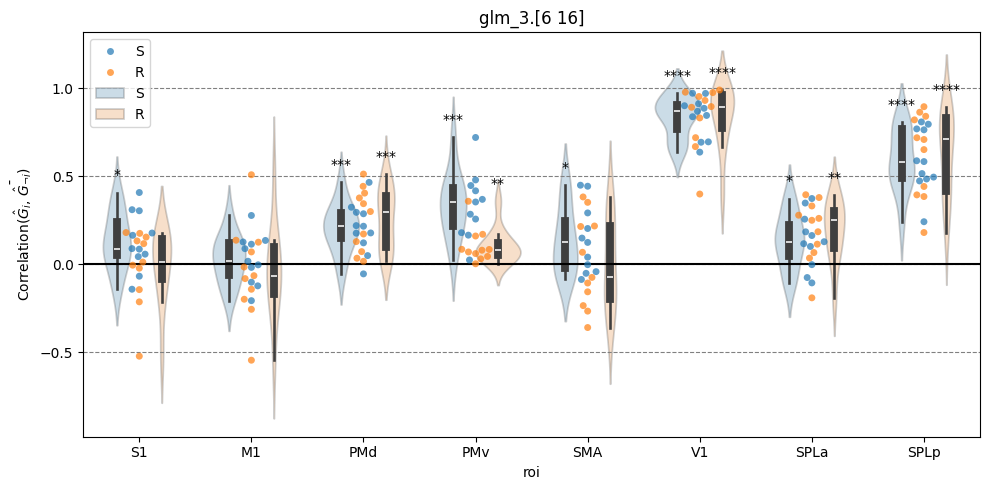

In [59]:
dy = np.diff(ax.get_ylim())*0.025

for ii, roi in enumerate(list_roi):
    for gg, group in enumerate(['S','R']):
        a = df[(df.roi==roi)&(df.sess==group)]['corr'].astype(float)
        tval, pval = ttest_1samp(a, popmean=0)
        if pval < 0.05:
            print(roi, group, '%.3e(%s)'%(pval,convert_pvalue_to_asterisks(pval)))
            x = 0.4*(gg-0.5) + ii
            y = a.max() + dy
            ax.text(
                x=x, y=y,
                s=convert_pvalue_to_asterisks(pval), fontsize=10,
                ha='center', va='bottom'
            )
fig.tight_layout()
fig

In [60]:
fig.savefig(
    join(dir_result,'fig.%s.G_hat.ROIs.crossval.png'%glm),
    dpi=300, facecolor=[1,1,1,1],
    bbox_inches='tight'
)

---

## PCM
### Build the models
Now we are building a list of models, using a list of second moment matrices

In [51]:
# Make an empty list
M = []

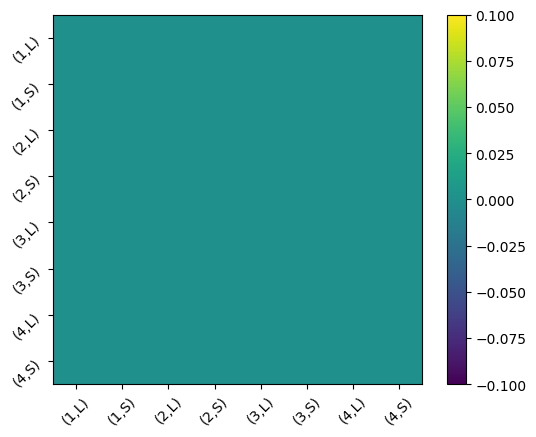

In [52]:
# Null model: All fingers are represented independently. 
# For RSA model that would mean that all distances are equivalent
model = np.eye(8)
model = np.zeros((8,8))

plt.imshow(model)
plt.xticks(np.arange(len(list_label)), list_label, rotation=45)
plt.yticks(np.arange(len(list_label)), list_label, rotation=45)
plt.colorbar()

M.append(pcm.FixedModel('null',model))

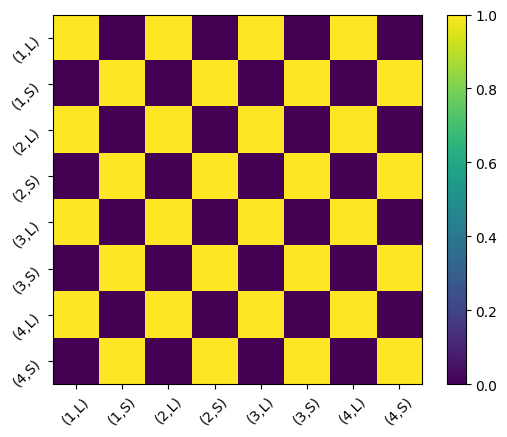

In [53]:
## Cue
model1 = np.zeros((8,8))
for row, a in enumerate(list_label):
    for col, b in enumerate(list_label):
        if ('L' in a)&('L' in b):
            val = 1
        elif ('S' in a)&('S' in b):
            val = 1
        else:
            val = 0
        model1[row,col] = val
plt.imshow(model1)
plt.xticks(np.arange(len(list_label)), list_label, rotation=45)
plt.yticks(np.arange(len(list_label)), list_label, rotation=45)
plt.colorbar()

M.append(pcm.FixedModel('Cue',model1))

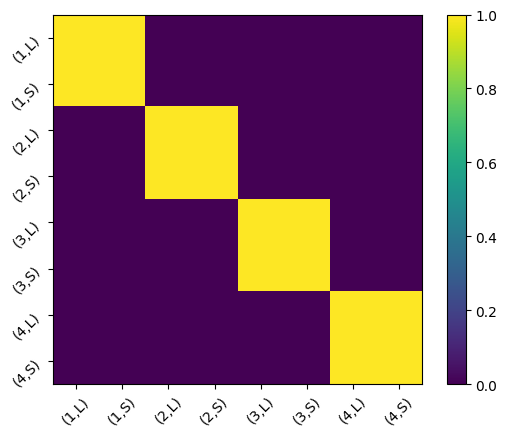

In [54]:
## Seq
model2 = np.zeros((8,8))
for row, a in enumerate(list_label):
    for col, b in enumerate(list_label):
        if ('1' in a)&('1' in b):
            val = 1
        elif ('2' in a)&('2' in b):
            val = 1
        elif ('3' in a)&('3' in b):
            val = 1
        elif ('4' in a)&('4' in b):
            val = 1
        else:
            val = 0
        model2[row,col] = val
plt.imshow(model2)
plt.xticks(np.arange(len(list_label)), list_label, rotation=45)
plt.yticks(np.arange(len(list_label)), list_label, rotation=45)
plt.colorbar()

M.append(pcm.FixedModel('Seq',model2))

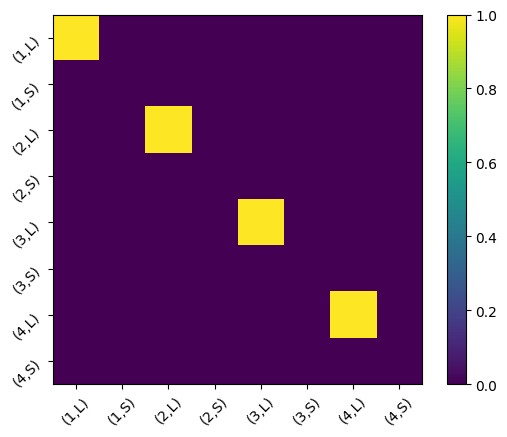

In [55]:
## Seq, Letter
model3 = np.zeros((8,8))
for row, a in enumerate(list_label):
    for col, b in enumerate(list_label):
        if ('S' in a)|('S' in b):
            val = 0
        else:
            if ('1' in a)&('1' in b):
                val = 1
            elif ('2' in a)&('2' in b):
                val = 1
            elif ('3' in a)&('3' in b):
                val = 1
            elif ('4' in a)&('4' in b):
                val = 1
            else:
                val = 0
        model3[row,col] = val
plt.imshow(model3)
plt.xticks(np.arange(len(list_label)), list_label, rotation=45)
plt.yticks(np.arange(len(list_label)), list_label, rotation=45)
plt.colorbar()

M.append(pcm.FixedModel('Seq_Letter',model3))

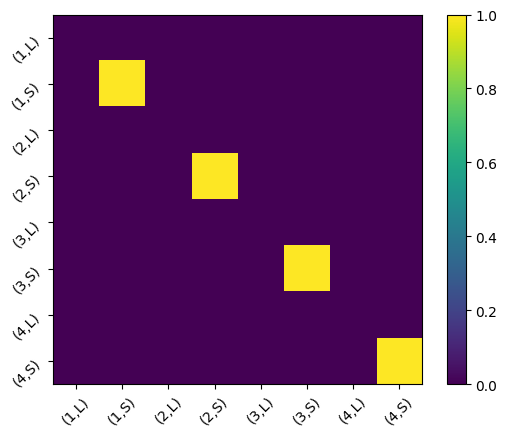

In [56]:
## Seq, Spatial
model4 = np.zeros((8,8))
for row, a in enumerate(list_label):
    for col, b in enumerate(list_label):
        if ('L' in a)|('L' in b):
            val = 0
        else:
            if ('1' in a)&('1' in b):
                val = 1
            elif ('2' in a)&('2' in b):
                val = 1
            elif ('3' in a)&('3' in b):
                val = 1
            elif ('4' in a)&('4' in b):
                val = 1
            else:
                val = 0
        model4[row,col] = val
plt.imshow(model4)
plt.xticks(np.arange(len(list_label)), list_label, rotation=45)
plt.yticks(np.arange(len(list_label)), list_label, rotation=45)
plt.colorbar()

M.append(pcm.FixedModel('Seq_Spatial',model4))

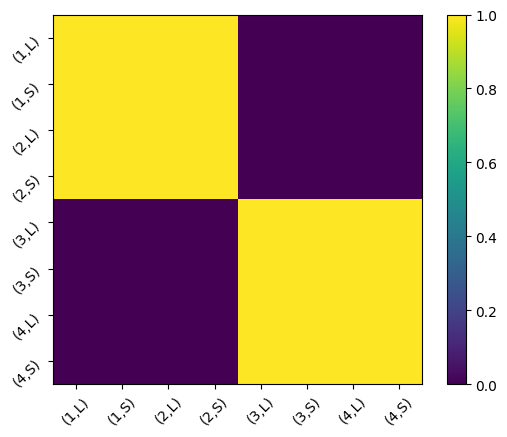

In [57]:
## first finger
model5 = np.zeros((8,8))
for row, a in enumerate(list_label):
    for col, b in enumerate(list_label):
        if ('1' in a)&('1' in b):
            val = 1
        elif ('1' in a)&('2' in b):
            val = 1
        elif ('2' in a)&('1' in b):
            val = 1
        elif ('2' in a)&('2' in b):
            val = 1
        elif ('1' in a)&('2' in b):
            val = 1
        elif ('3' in a)&('3' in b):
            val = 1
        elif ('3' in a)&('4' in b):
            val = 1
        elif ('4' in a)&('3' in b):
            val = 1
        elif ('4' in a)&('4' in b):
            val = 1
        else:
            val = 0
        model5[row,col] = val
plt.imshow(model5)
plt.xticks(np.arange(len(list_label)), list_label, rotation=45)
plt.yticks(np.arange(len(list_label)), list_label, rotation=45)
plt.colorbar()

M.append(pcm.FixedModel('first_finger',model5))

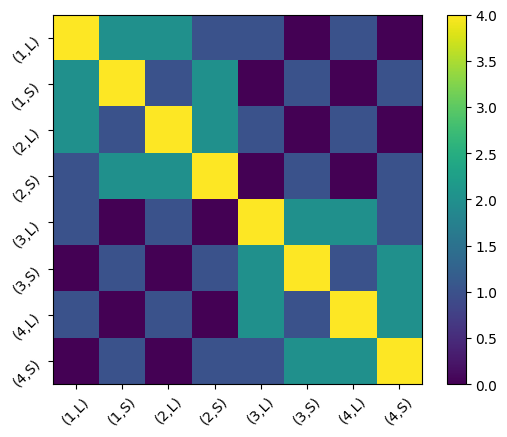

In [58]:
plt.imshow(model1+model2+model3+model4+model5)
plt.xticks(np.arange(len(list_label)), list_label, rotation=45)
plt.yticks(np.arange(len(list_label)), list_label, rotation=45)
plt.colorbar()

M.append(pcm.ComponentModel('component',[model1,model2,model3,model4,model5]))

In [59]:
M.append(pcm.FreeModel('ceil',8)) # Noise ceiling model
M

### Model fitting

Now let's fit the models to individual data set. There are three ways to do this. We can fit the models
- to each individual participant with it's own parameters $\theta$.
- to each all participants together with shared parameters, but with an individual parameter for the signal strength and for group.
- in a cross-participant crossvalidated fashion. The models are fit to N-1 subjects and evaluated on the Nth subject.

100%|██████████| 11/11 [01:37<00:00,  8.82s/it]


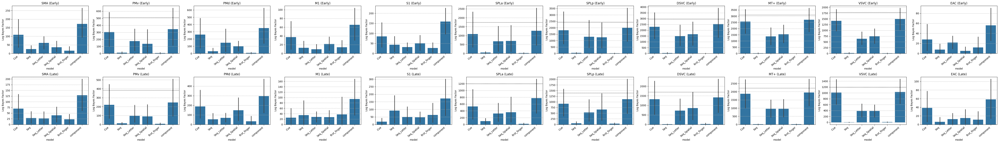

In [60]:
nrows = 2 ## group S/R
ncols = len(list_roi)
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*5,nrows*4))

for ii, (roi, Y) in enumerate(tqdm(dataset_Y.items())):
    ## 1. session S
    ax = axs[0,ii]
    plt.sca(ax)
    
    # Do the individual fits - suppress verbose printout
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        T_in, theta_in = pcm.fit_model_individ(Y[:12], M, fit_scale = True, verbose = False)
    
    pcm.model_plot(
        T_in.likelihood,
        null_model = 'null', noise_ceiling= 'ceil'
    )
    ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=40, ha='right')
    ax.grid(axis='y', linestyle='--')
    ax.set_title('%s (Early)'%roi)

    ## 2. session R
    ax = axs[1,ii]
    plt.sca(ax)
    
    # Do the individual fits - suppress verbose printout
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        T_in, theta_in = pcm.fit_model_individ(Y[12:], M, fit_scale = True, verbose = False)
    
    pcm.model_plot(
        T_in.likelihood,
        null_model = 'null', noise_ceiling= 'ceil'
    )
    ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=40, ha='right')
    ax.grid(axis='y', linestyle='--')
    ax.set_title('%s (Late)'%roi)

fig.tight_layout()

In [61]:
# fig.savefig(
#     join(dir_result,'fig.%s.pcm.T_in.png'%dname),
#     dpi=300, facecolor=[1,1,1,1],
#     bbox_inches='tight'
# )

The likelihoods are very negative and quite different across participants, which is expected (see documentation). What we need to interpret are the difference is the likelihood relative to a null model. We can visualized these using the model_plot

In [62]:
def get_G_pred(M, theta_gr):
    res = []
    for model_num in [-2, -1]:
        model = M[model_num]
        G,_ = model.predict(theta_gr[model_num][:model.n_param])
        res.append(
            {'name': model.name, 'n_param':model.n_param, 'G_pred':G}
        )
    return res

  0%|          | 0/11 [00:00<?, ?it/s]

SMA
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


  9%|▉         | 1/11 [02:12<22:00, 132.05s/it]

PMv
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


 18%|█▊        | 2/11 [03:53<17:04, 113.86s/it]

PMd
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


 27%|██▋       | 3/11 [06:11<16:41, 125.19s/it]

M1
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


 36%|███▋      | 4/11 [08:27<15:05, 129.38s/it]

S1
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


 45%|████▌     | 5/11 [10:39<13:01, 130.27s/it]

SPLa
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


 55%|█████▍    | 6/11 [12:37<10:30, 126.12s/it]

SPLp
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


 64%|██████▎   | 7/11 [14:42<08:22, 125.69s/it]

DSVC
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


 73%|███████▎  | 8/11 [16:41<06:11, 123.71s/it]

MT+
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


 82%|████████▏ | 9/11 [19:01<04:17, 128.73s/it]

VSVC
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


 91%|█████████ | 10/11 [20:59<02:05, 125.52s/it]

EAC
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7
Fitting group model 0
Fitting group model 1
Fitting group model 2
Fitting group model 3
Fitting group model 4
Fitting group model 5
Fitting group model 6
Fitting group model 7
Fitting group cross model 0
Fitting group cross model 1
Fitting group cross model 2
Fitting group cross model 3
Fitting group cross model 4
Fitting group cross model 5
Fitting group cross model 6
Fitting group cross model 7


100%|██████████| 11/11 [23:36<00:00, 128.79s/it]


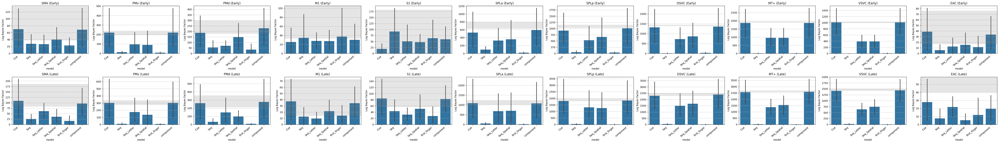

In [86]:
nrows = 2 ## group S/R
ncols = len(list_roi)
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*5,nrows*4))

model_pred = []
for ii, (roi, Y) in enumerate(tqdm(dataset_Y.items())):
    print(roi)
    
    ## 1. group S
    ax = axs[0,ii]
    plt.sca(ax)
    
    # crossvalidated likelihood
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        T_gr, theta_gr = pcm.fit_model_group(Y[12:], M, fit_scale=True)
        T_cv, theta_cv = pcm.fit_model_group_crossval(Y[12:], M, fit_scale=True)

    tmp = {}
    tmp['sess']='S'
    tmp['roi']=roi
    res = get_G_pred(M, theta_gr)
    for dict_ in res:
        for key, val in dict_.items():
            tmp[key] = val
        model_pred.append(tmp.copy())
    
    pcm.model_plot(
        T_cv.likelihood,
        null_model = 'null', noise_ceiling= 'ceil',
        upper_ceiling = T_gr.likelihood['ceil']
    )
    ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=40, ha='right')
    ax.grid(axis='y', linestyle='--')
    ax.set_title('%s (Early)'%roi)

    ## 2. group R
    ax = axs[1,ii]
    plt.sca(ax)
    
    # crossvalidated likelihood
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        T_gr, theta_gr = pcm.fit_model_group(Y[:12], M, fit_scale=True)
        T_cv, theta_cv = pcm.fit_model_group_crossval(Y[:12], M, fit_scale=True)

    tmp = {}
    tmp['sess']='R'
    tmp['roi']=roi
    res = get_G_pred(M, theta_gr)
    for dict_ in res:
        for key, val in dict_.items():
            tmp[key] = val
        model_pred.append(tmp.copy())
    
    pcm.model_plot(
        T_cv.likelihood,
        null_model = 'null', noise_ceiling= 'ceil',
        upper_ceiling = T_gr.likelihood['ceil']
    )
    ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=40, ha='right')
    ax.grid(axis='y', linestyle='--')
    ax.set_title('%s (Late)'%roi)

fig.tight_layout()

In [62]:
fig.savefig(
    join(dir_result,'fig.%s.pcm.T_cv.png'%dname),
    dpi=300, facecolor=[1,1,1,1],
    bbox_inches='tight'
)

The problem with the noise ceiling is that it is individually fit to each subject. It has much more parameters than the models it is competing against, so it is overfitting. To compare models with different numbers of parameters directly, we need to look at our cross-validated group fits. The group fits can be used as an upper noise ceiling.

### Visualizing the model fit

Finally, it is very useful to visualize the model prediction in comparision to the fitted data. The model parameters are stored in the return argument `theta`. We can pass these to the `Model.predict()` function to get the predicted second moment matrix.

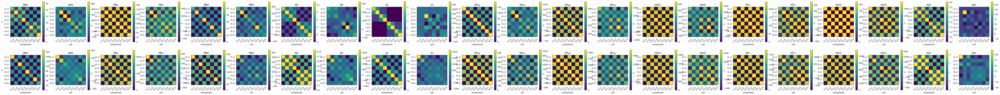

In [87]:
nrow = 2 # the number of sessions
ncols = len(model_pred)//2 # the number of ROIs * the number of models (=2)

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4,nrows*4))

for ii, dict_ in enumerate(model_pred):
    ii_ = ii//2 # 0: (roi1,S), 1: (roi1,R), 2: (roi2,S), ...
    jj_ = ii%2 # model index 0: component, 1: ceil
        
    aa_ = ii_%2 # session index 0: S, 1: R
    bb_ = ii_//2 # roi index 0: roi1, 1: roi2, ...
    cc_ = bb_*2+jj_ # column index
    ax = axs[aa_, cc_]
    plt.sca(ax)

    G = dict_['G_pred']
    # for row in range(G.shape[0]):
    #     for col in range(G.shape[1]):
    #         text = plt.text(
    #             col, row, f"{G[row, col]:.1f}",
    #             ha="center", va="center", color="black"
    #         )
    plt.imshow(G)
    plt.colorbar()
    # plt.title('%s (%s)'%(dict_['roi'],dict_['name']))
    plt.title(dict_['roi'])
    plt.xlabel(dict_['name'])
    if cc_ == 0:
        plt.ylabel(dict_['sess'])
    else:
        plt.ylabel('')
    plt.xticks(ticks=range(8), labels=list_label, rotation=40)
    plt.yticks(ticks=range(8), labels=list_label, rotation=0)

# fig.tight_layout()

---

## RDM

In [24]:
dir_surf = join('F:/SeqSpatialSupp_fMRI/surfaceWB')
dir_pattern = join(dir_work,'patterns/glm3.onset_move')
dir_atlas = join(dir_git,'diedrichsenlab/atlas/fs_LR_32k')
exists(dir_pattern)

True

In [25]:
underlay = join(dir_atlas,'fs_LR.32k.LR.sulc.dscalar.gii')
border = join(dir_git,'surfAnalysisPy/standard_mesh/fs_L/fs_LR.32k.L.border')

In [28]:
roi = nb.load(join(dir_atlas,'ROI.L.SSS.label.gii'))
list_roi = ['SMA', 'PMv', 'PMd', 'M1', 'S1', 'SPLa', 'SPLp', 'DSVC', 'MT+', 'VSVC', 'EAC']
data_roi = roi.darrays[0].data

### load residual

In [26]:
subj = 'S01'

In [29]:
ResMS = join(dir_work,'glm_3',subj,'ResMS.nii')

In [30]:
ResMS_mapped = surf.map.vol_to_surf(
    volumes=[ResMS],
    whiteSurfGifti=join(dir_surf,subj,'%s.L.white.32k.surf.gii'%subj),
    pialSurfGifti=join(dir_surf,subj,'%s.L.pial.32k.surf.gii'%subj),
    excludeThres=0.9,
    stats='nanmean'
)

<Axes: >

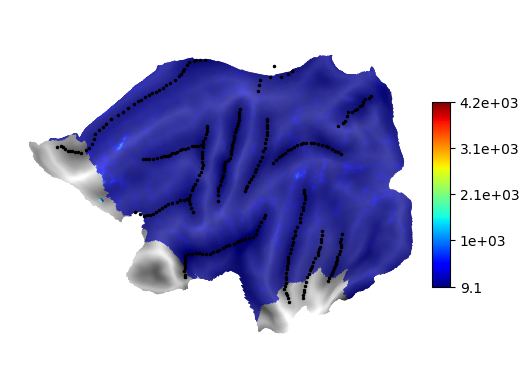

In [33]:
surf.plot.plotmap(
    data=ResMS_mapped,
    surf='fs32k_L',
    underlay=underlay, alpha=0.7, cmap=cm.jet, colorbar=True,
    borders=border, bordercolor='black', bordersize=3,
    overlay_type='func', render='matplotlib'
)

- ROIs:
    1. SMA
    2. PMv
    3. PMd
    4. M1
    5. S1
    6. SPLa
    7. SPLd
    8. DSVC
    9. MT+
    10. VSVC
    11. EAC
- State: $(s,c)$, where $s$ is Sequence, $c$ is Cue.
    1. $s$
        - 0: 32451
        - 1: 35124
        - 2: 13254
        - 3: 14523
    2. $c$ :
        - 0: letter
        - 1: spatial
- Transition: $(s_i, c_i) \rightarrow (s_f, c_f)$
    - 0: (0,0) -> (0,0)
    - 1: (0,0) -> (0,1)
    - $\vdots$
    - 63: (3,1) -> (3,1)

|     |(0,0)|(0,1)|(1,0)|(1,1)|(2,0)|(2,1)|(3,0)|(3,1)| 
|-----|-----|-----|-----|-----|-----|-----|-----|-----|
|(0,0)|  B  | S00 | C01 | N02 | C03 | N04 | C05 | N06 |
|(0,1)|     |  B  | N07 | C08 | N09 | C10 | N11 | C12 |
|(1,0)|     |     |  B  | S13 | C14 | N15 | C16 | N17 |
|(1,1)|     |     |     |  B  | N18 | C19 | N20 | C21 |
|(2,0)|     |     |     |     |  B  | S22 | C23 | N24 |
|(2,1)|     |     |     |     |     |  B  | N25 | C26 |
|(3,0)|     |     |     |     |     |     |  B  | S27 |
|(3,1)|     |     |     |     |     |     |     |  B  |

$$\downarrow$$

|     |(0,0)|(1,0)|(2,0)|(3,0)|(0,1)|(1,1)|(2,1)|(3,1)| 
|-----|-----|-----|-----|-----|-----|-----|-----|-----|
|(0,0)|  B  | C01 | C03 | C05 | S00 | N02 | N04 | N06 |
|(1,0)|     |  B  | C14 | C16 | N07 | S13 | N15 | N17 |
|(2,0)|     |     |  B  | C23 | N09 | N18 | S22 | N24 |
|(3,0)|     |     |     |  B  | N11 | N20 | N25 | S27 |
|(0,1)|     |     |     |     |  B  | C08 | C10 | C12 |
|(1,1)|     |     |     |     |     |  B  | C19 | C21 |
|(2,1)|     |     |     |     |     |     |  B  | C26 |
|(3,1)|     |     |     |     |     |     |     |  B  |

In [90]:
idx_RDM = np.array([
    1, 3, 5, 0, 2, 4, 6,
    14, 16, 7, 13, 15, 17,
    23, 9, 18, 22, 24,
    11, 20, 25, 27,
    8, 10, 12,
    19, 21,
    26
])

$$RDM = \begin{bmatrix}
\textcolor{gray}{B} & C & C & C & S & N & N & N \\
\cdot & \textcolor{gray}{B} & C & C & N & S & N & N \\
\cdot & \cdot & \textcolor{gray}{B} & C & N & N & S & N \\
\cdot & \cdot & \cdot & \textcolor{gray}{B} & N & N & N & S \\
\cdot & \cdot & \cdot & \cdot & \textcolor{gray}{B} & C & C & C \\
\cdot & \cdot & \cdot & \cdot & \cdot & \textcolor{gray}{B} & C & C \\
\cdot & \cdot & \cdot & \cdot & \cdot & \cdot & \textcolor{gray}{B} & C \\
\cdot & \cdot & \cdot & \cdot & \cdot & \cdot & \cdot & \textcolor{gray}{B}
\end{bmatrix}$$
The number of elements on the upper triangle $= \frac{8\cdot 7}{2} = 28$
- B: both of cue and sequence repetition (8 trials)
- S: only sequence repetition (8 trials)
- C: only cue repetition (24 trials)
- N: no repetition (24 trials)

In [91]:
RDM = np.array([
    'C', 'C', 'C', 'S', 'N', 'N', 'N',
         'C', 'C', 'N', 'S', 'N', 'N',
              'C', 'N', 'N', 'S', 'N',
                   'N', 'N', 'N', 'S',
                        'C', 'C', 'C',
                             'C', 'C',
                                  'C'
])

In [17]:
list_var = ['beta', 'glm', 'subj', 'nvoxels', 'ROI', 'normmode', 'RDM',]

subj = 'S01' ## -> ss
data = scipy.io.loadmat(join(dir_pattern,'%s_fRDM.glm3.mat'%subj))['Data']
for i, dd in enumerate(data[0,0]):
    print('i=%d: %s - %s'%(i,dd.shape,list_var[i]))
betas = data[0,0][0][:,0]
nvoxels = data[0,0][3][:,0]
rois = data[0,0][4][:,0]
rdms = data[0,0][6][:,0]

i=0: (11, 1) - beta
i=1: (22, 1) - glm
i=2: (22, 1) - subj
i=3: (22, 1) - nvoxels
i=4: (22, 1) - ROI
i=5: (11,) - normmode
i=6: (11, 1) - RDM


In [26]:
# list_diss = df.diss.unique()
list_diss = [
    'diffFing_within_L', 'diffFing_within_S', 'diffFing_across',
    'diffSeq_sameFing_within_L', 'diffSeq_sameFing_within_S', 'diffSeq_sameFing_across',
    'sameSeq_across'
]
list_diss

['diffFing_within_L',
 'diffFing_within_S',
 'diffFing_across',
 'diffSeq_sameFing_within_L',
 'diffSeq_sameFing_within_S',
 'diffSeq_sameFing_across',
 'sameSeq_across']

In [30]:
list_diss = []

for s, ss in enumerate(list_ss):
    for n, nn in enumerate(list_nn):
        subj = ss+nn
        fname = join(dir_pattern,'%s_fRDM.glm3.mat'%subj)
        if not exists(fname):
            ## R11, R13(?)이 문제. subj_fRDM.glm3.mat 파일을 만들지 못함
            continue
        data = scipy.io.loadmat(fname)['Data'][0,0]
        betas = data[0][:,0]
        nvoxels = data[3][:,0]
        rois = data[4][:,0]
        rdms = data[6][:,0]
        for rr, roi_ in enumerate(rois[:11]):
            roi = str(roi_[0])[4:-2]
            # print(roi)
            
            rdm = rdms[rr][0]
            rdm_ordered = rdm[idx_RDM].copy()
    
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'sameSeq_across', 'mean':rdm_ordered[np.where(RDM=='S')[0]].mean()})
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'diffSeq_across', 'mean':rdm_ordered[np.where(RDM=='N')[0]].mean()})
            
            tmp = np.where(RDM=='C')[0];
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'diffSeq_within_L', 'mean':rdm_ordered[tmp[tmp<14]].mean()})
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'diffSeq_within_S', 'mean':rdm_ordered[tmp[tmp>=14]].mean()})
            
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'diffSeq_sameFing_within_L', 'mean':rdm_ordered[[0,13]].mean()})
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'diffSeq_sameFing_within_S', 'mean':rdm_ordered[[22,27]].mean()})
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'diffSeq_sameFing_across', 'mean':rdm_ordered[[4,9,17,20]].mean()})
            
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'diffFing_within_L', 'mean':rdm_ordered[[1,2,7,8]].mean()})
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'diffFing_within_S', 'mean':rdm_ordered[[23,24,25,26]].mean()})
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'diffFing_across', 'mean':rdm_ordered[[5,6,11,12,14,15,18,19]].mean()})
            
            list_diss.append({'sess':ss, 'subj':nn, 'roi':roi, 'diss':'sameFing_across', 'mean':rdm_ordered[[3,4,9,10,16,17,20,21]].mean()})

In [31]:
df = pd.DataFrame(list_diss)
print(df.subj.unique())
df

['01' '02' '03' '05' '06' '08' '09' '10' '11' '12' '13' '14']


,sess,subj,roi,diss,mean
0,S,01,SMA,sameSeq_across,-6.991608e+12+8.886161e+ 11j
1,S,01,SMA,diffSeq_across,-4.847319e+12+1.283075e+ 12j
2,S,01,SMA,diffSeq_within_L,-2.150976e+12-6.085715e+ 11j
3,S,01,SMA,diffSeq_within_S,-3.644076e+12+2.145770e+ 12j
4,S,01,SMA,diffSeq_sameFing_within_L,1.368583e+12+2.195236e+ 12j
...,...,...,...,...,...
2415,R,10,EAC,diffSeq_sameFing_across,-1.826532e+12-3.294652e+ 12j
2416,R,10,EAC,diffFing_within_L,9.645179e+11-4.876234e+ 12j
2417,R,10,EAC,diffFing_within_S,2.106207e+12-5.686281e+ 12j
2418,R,10,EAC,diffFing_across,-1.033269e+11-5.070783e+ 12j


In [34]:
ncols = len(list_diss)
nrows = 1
# fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8*ncols,6*nrows))
for ss, sess in enumerate(['S','R','total']):
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols,4*nrows))
    for ii, diss in enumerate(list_diss):
        # ax = axs[gg,ii]
        ax = axs[ii]
        plt.sca(ax)

        if not sess == 'total':
            df_tmp = df[(df.sess==sess)&(df.diss==diss)]
        else:
            df_tmp = df[df.diss==diss]
            
        sns.barplot(
            data=df_tmp,
            x='roi', y='mean',
            capsize=0.2, errorbar='se'
        )
        plt.xticks(rotation=30, fontsize=14)
        plt.ylabel('Mean Dissimilarity (A.U.)', fontsize=18)
        plt.xlabel('')
        plt.title('%s (sess %s)'%(diss,sess), fontsize=20)
        plt.grid(axis='y', linestyle='--')

    # fig.savefig(
    #     join(dir_work,'results/fig.barplot.glm3.rdm.%s.png'%group),
    #     dpi=300, facecolor=[1,1,1,1],
    #     bbox_inches = "tight"
    # )

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x000001B451A14AF0> (for post_execute), with arguments args (),kwargs {}:


ValueError: Image size of 1452000x400 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 1452000x400 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1.452e+06x400 with 2420 Axes>

ValueError: Image size of 1452000x400 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1.452e+06x400 with 2420 Axes>

ValueError: Image size of 1452000x400 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1.452e+06x400 with 2420 Axes>

### Euclidean Distance $D^{2}$:

$$ diag(CGC^{T}) \rightarrow D^{2} $$

---